In [ ]:
# https://stackoverflow.com/questions/59376555/how-to-draw-a-transparent-ellipse-in-python-with-pillow-without-outline
!pip install --upgrade Pillow
pass

     |████████████████████████████████| 2.2MB 4.8MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [ ]:
from PIL import Image, ImageDraw
import numpy as np
import math
import IPython.display
import random
from tqdm import tqdm
import matplotlib.pyplot as plt
import time
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


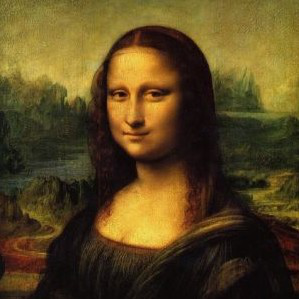

In [ ]:
orginal = Image.open('/content/drive/My Drive/monalisa.jpg')
orginal = np.array(orginal)

IPython.display.display(Image.fromarray(orginal.astype('uint8')))

In [ ]:
def shapes_to_image(chromosome):
    
    # https://stackoverflow.com/questions/59376555/how-to-draw-a-transparent-ellipse-in-python-with-pillow-without-outline
    def shape_to_image(shape, draw):
        draw.ellipse([(shape[0], shape[1]), (shape[2], shape[3])], (shape[4], shape[5], shape[6], shape[7]), None, 0)
    img = Image.new('RGB', (299, 299), (0, 0, 0))
    draw = ImageDraw.Draw(img, 'RGBA')
    for shape in chromosome:
        shape_to_image(shape, draw)
    
    return img

In [ ]:
def random_circle():
     x = random.randint(0, 295)
     y = random.randint(0, 295)
     rad = random.randint(5, 100)
     colors = np.random.randint(0, 255, 3)
     opacity = random.randint(50, 150)

     return [x, y, x + rad, y + rad, *colors, opacity]

def random_chromosome(len):
    chromosome = np.zeros((len, 8), dtype = np.int32)
    for l in range(len):
        chromosome[l, :] = random_circle()
    return chromosome

In [ ]:
def obj_fun(orginal, individual):
    orginal = orginal.astype('int64')
    err = ((orginal - individual)**2).sum()
    return err

In [ ]:
def get_rad(circle):
    return circle[2] - circle[0]

def set_rad(circle, rad):
    circle[2] = circle[0] + rad
    circle[3] = circle[1] + rad
    return circle

def circle_make_visible(circle):
    if circle[0] < 0:
        circle[0] = 0
    if circle[0] > 290:
        circle[0] = 290
    if circle[1] < 0:
        circle[1] = 0
    if circle[1] > 290:
        circle[1] = 290
    if circle[4] < 0:
        circle[4] = 0
    if circle[4] > 255:
        circle[4] = 255
    if circle[5] < 0:
        circle[5] = 0
    if circle[5] > 255:
        circle[5] = 255
    if circle[6] < 0:
        circle[6] = 0
    if circle[6] > 255:
        circle[6] = 255
    if circle[7] < 50:
        circle[7] = 50
    if circle[7] > 150:
        circle[7] = 150
    return circle

def mutate_circle_color(circle, mutation_power):
    circle[4:] += np.floor(mutation_power*(np.random.uniform(low=-1, high=1, size=4))).astype(int)
    circle = circle_make_visible(circle)
    return circle

def mutate_circle_position(circle, mutation_power):
    mutation = np.floor(mutation_power*(np.random.uniform(low=-1, high=1, size=3))).astype(int)
    circle[:2] += mutation[:2]
    circle = circle_make_visible(circle)
    circle = set_rad(circle, get_rad(circle) + mutation[2])
    if get_rad(circle) < 5:
        circle = set_rad(circle, 5)
    if get_rad(circle) > 100:
        circle = set_rad(circle, 100)

    return circle

def mutate_dna_slightly_change_circle(dna, mutation_probability, mutation_power):
    size = len(dna)
    mask_color = np.random.choice([0, 1], size = size, p=[1 - mutation_probability, mutation_probability])
    mask_position = np.random.choice([0, 1], size = size, p=[1 - mutation_probability, mutation_probability])
    for i in range(size):
        if mask_color[i]:
            dna[i, :] = mutate_circle_color(dna[i, :], mutation_power)
        if mask_position[i]:
            dna[i, :] = mutate_circle_position(dna[i, :], mutation_power)
    return dna

In [ ]:
def main_loop(generations, number_of_offspring, no_of_circles, mutation_probability, mutation_power):

    parent = random_chromosome(no_of_circles)
    best_child = parent.copy()
    children = np.zeros((number_of_offspring, no_of_circles, 8))
    best = np.Inf
    costs = np.zeros(generations)

    for t in tqdm(range(generations)):
        for i in range(number_of_offspring):
            children[i, :, :] = parent.copy()
            children[i, :, :] = mutate_dna_slightly_change_circle(children[i, :, :], mutation_probability, mutation_power)
            fitness = obj_fun(orginal, shapes_to_image(children[i, :, :].astype('int')))
            if fitness < best:
                best = fitness
                best_child = children[i, :, :].copy()

        parent = best_child.copy()
        costs[t] = best
        if t % 200 is 0:
            print(best)
            IPython.display.display(shapes_to_image(parent.astype('int')))

    return parent, costs 

  0%|          | 0/50000 [00:00<?, ?it/s]

2174142647


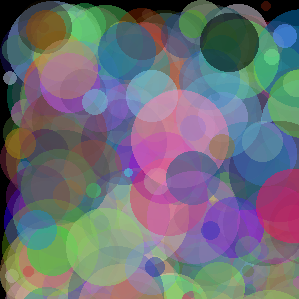

  0%|          | 198/50000 [00:09<40:40, 20.40it/s]

1450641802


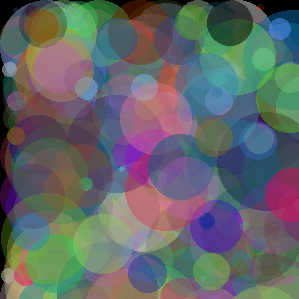

  1%|          | 399/50000 [00:19<41:13, 20.05it/s]

1013890878


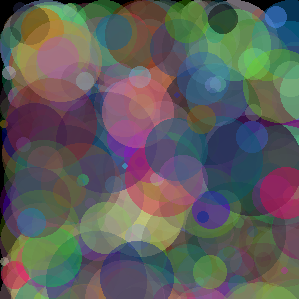

  1%|          | 599/50000 [00:29<40:53, 20.14it/s]

758986438


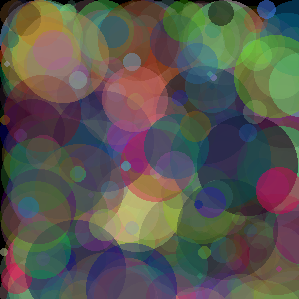

  2%|▏         | 800/50000 [00:39<41:29, 19.76it/s]

601491808


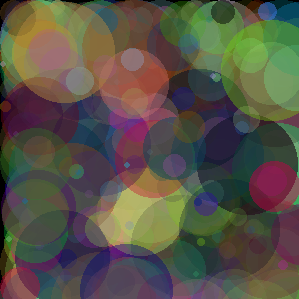

  2%|▏         | 999/50000 [00:49<40:01, 20.41it/s]

484629557


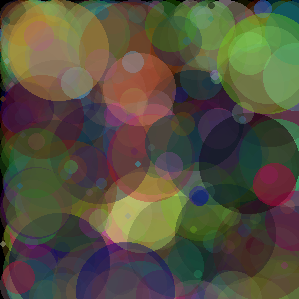

  2%|▏         | 1199/50000 [00:59<43:00, 18.91it/s]

409400373


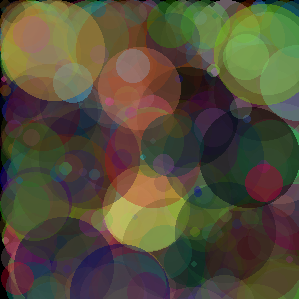

  3%|▎         | 1400/50000 [01:09<40:02, 20.23it/s]

355036780


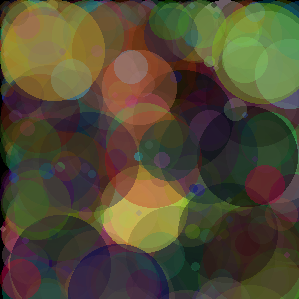

  3%|▎         | 1598/50000 [01:19<39:51, 20.24it/s]

315755528


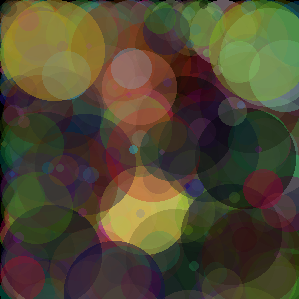

  4%|▎         | 1798/50000 [01:29<41:43, 19.25it/s]

281060587


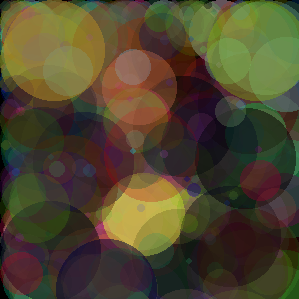

  4%|▍         | 1999/50000 [01:39<39:21, 20.32it/s]

258293777


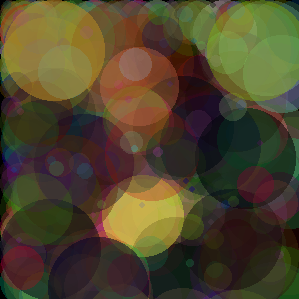

  4%|▍         | 2199/50000 [01:49<39:12, 20.32it/s]

238985517


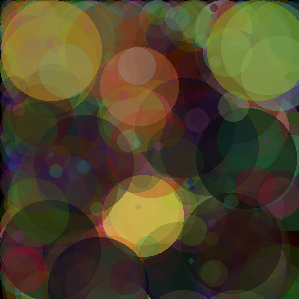

  5%|▍         | 2400/50000 [01:59<39:57, 19.85it/s]

225008953


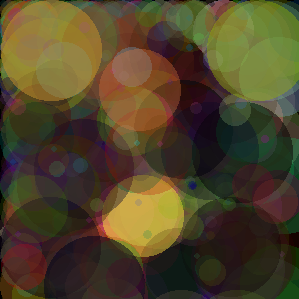

  5%|▌         | 2598/50000 [02:09<39:04, 20.22it/s]

213579617


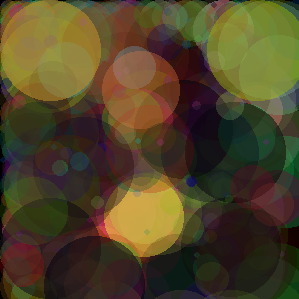

  6%|▌         | 2799/50000 [02:19<40:21, 19.49it/s]

202995773


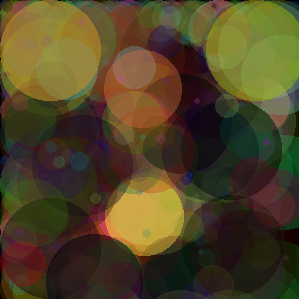

  6%|▌         | 3000/50000 [02:29<37:43, 20.77it/s]

191204106


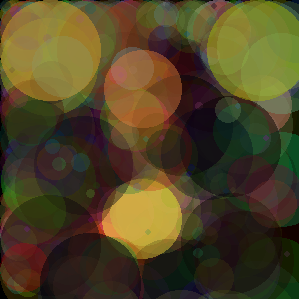

  6%|▋         | 3199/50000 [02:38<37:58, 20.54it/s]

180262303


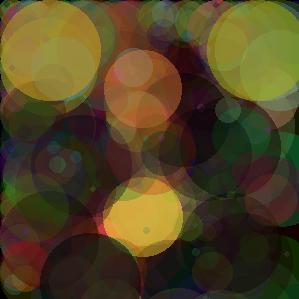

  7%|▋         | 3400/50000 [02:48<38:24, 20.22it/s]

172654447


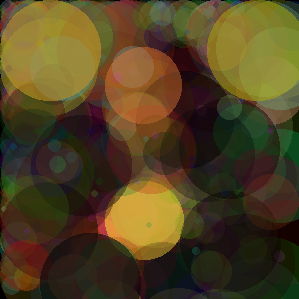

  7%|▋         | 3598/50000 [02:58<37:55, 20.40it/s]

167168678


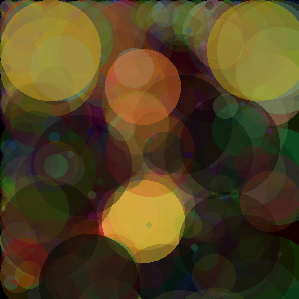

  8%|▊         | 3800/50000 [03:08<37:46, 20.39it/s]

161968375


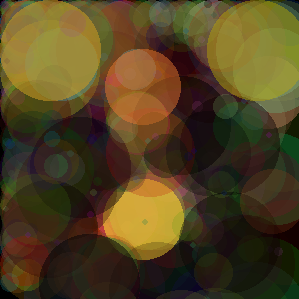

  8%|▊         | 4000/50000 [03:17<37:10, 20.63it/s]

159584531


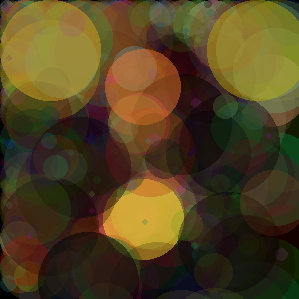

  8%|▊         | 4200/50000 [03:27<37:06, 20.57it/s]

156539429


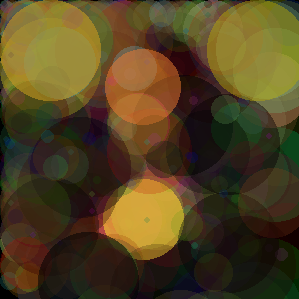

  9%|▉         | 4400/50000 [03:37<36:36, 20.76it/s]

154677748


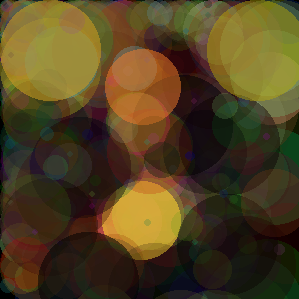

  9%|▉         | 4600/50000 [03:46<36:33, 20.70it/s]

152410587


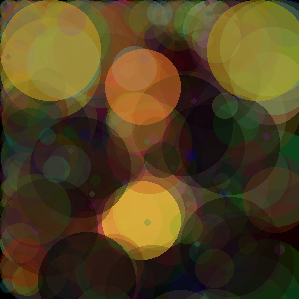

 10%|▉         | 4799/50000 [03:56<35:42, 21.10it/s]

149565503


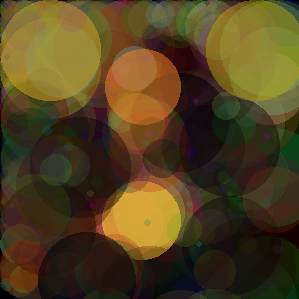

 10%|▉         | 4999/50000 [04:06<35:47, 20.96it/s]

147471235


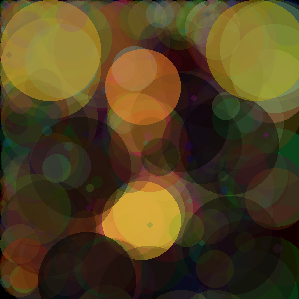

 10%|█         | 5199/50000 [04:15<36:22, 20.53it/s]

145790729


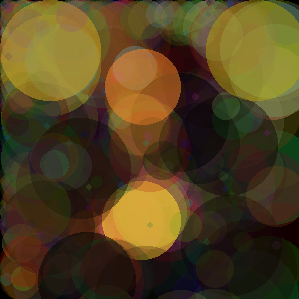

 11%|█         | 5400/50000 [04:25<35:11, 21.13it/s]

144735991


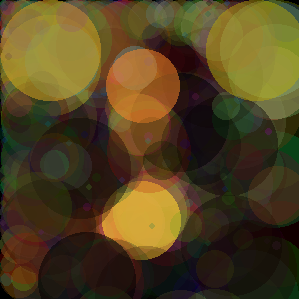

 11%|█         | 5598/50000 [04:34<35:10, 21.04it/s]

143696970


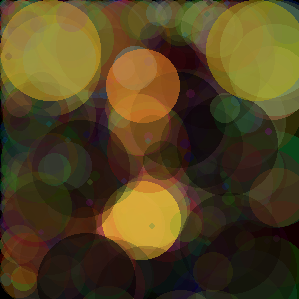

 12%|█▏        | 5798/50000 [04:44<35:14, 20.90it/s]

142194982


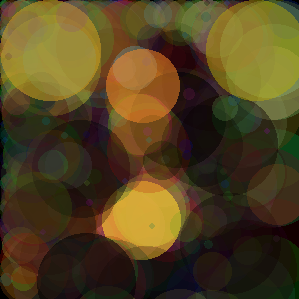

 12%|█▏        | 5998/50000 [04:54<35:11, 20.84it/s]

141067448


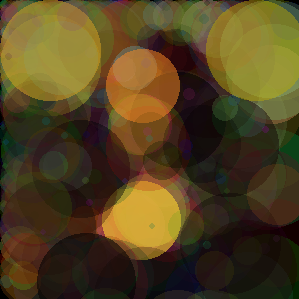

 12%|█▏        | 6200/50000 [05:04<34:25, 21.20it/s]

139813096


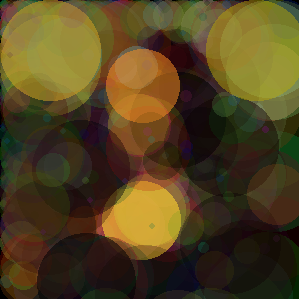

 13%|█▎        | 6398/50000 [05:13<35:07, 20.69it/s]

138830918


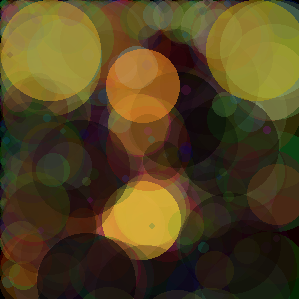

 13%|█▎        | 6598/50000 [05:23<34:02, 21.25it/s]

137506971


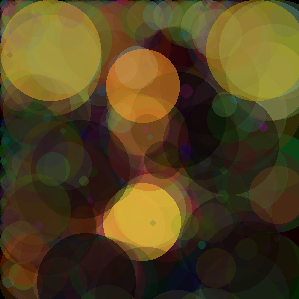

 14%|█▎        | 6799/50000 [05:32<34:01, 21.16it/s]

136491361


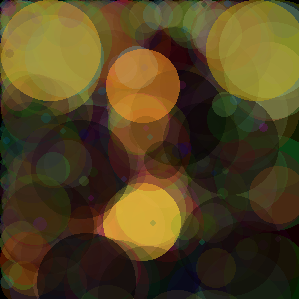

 14%|█▍        | 7000/50000 [05:42<34:12, 20.95it/s]

135344775


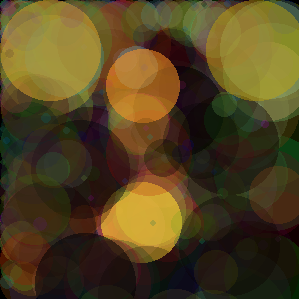

 14%|█▍        | 7198/50000 [05:51<33:59, 20.99it/s]

134712948


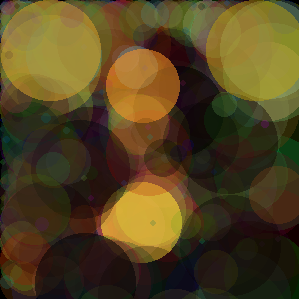

 15%|█▍        | 7399/50000 [06:01<33:19, 21.31it/s]

133809149


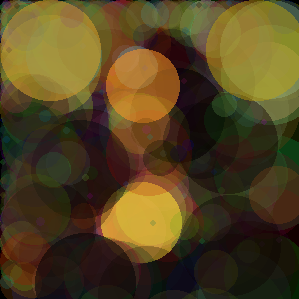

 15%|█▌        | 7600/50000 [06:11<34:02, 20.76it/s]

133072973


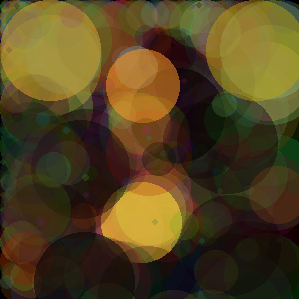

 16%|█▌        | 7799/50000 [06:20<33:31, 20.98it/s]

132285256


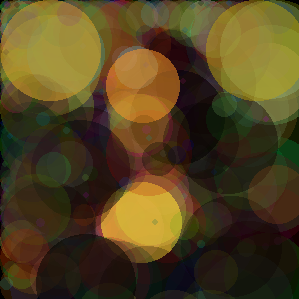

 16%|█▌        | 7999/50000 [06:30<32:59, 21.22it/s]

131549938


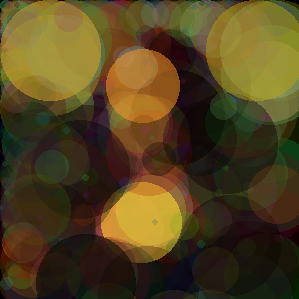

 16%|█▋        | 8199/50000 [06:40<33:18, 20.91it/s]

131168405


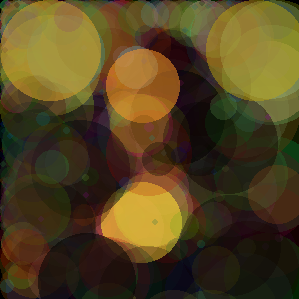

 17%|█▋        | 8398/50000 [06:49<32:57, 21.04it/s]

130913267


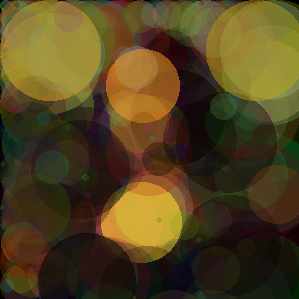

 17%|█▋        | 8598/50000 [06:59<33:12, 20.78it/s]

130340397


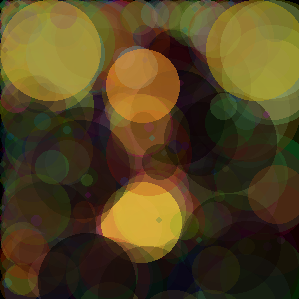

 18%|█▊        | 8798/50000 [07:08<32:32, 21.10it/s]

129526407


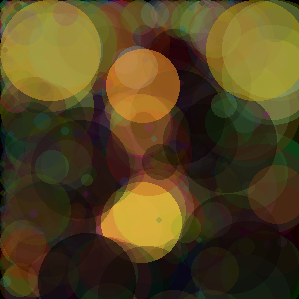

 18%|█▊        | 9000/50000 [07:18<32:36, 20.95it/s]

129077033


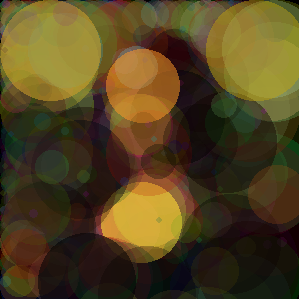

 18%|█▊        | 9200/50000 [07:27<32:32, 20.90it/s]

128614398


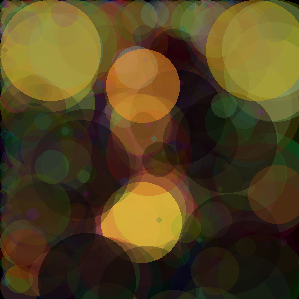

 19%|█▉        | 9398/50000 [07:37<31:39, 21.38it/s]

128390505


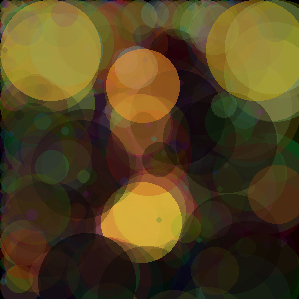

 19%|█▉        | 9599/50000 [07:46<32:40, 20.61it/s]

128140491


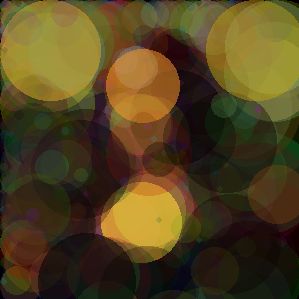

 20%|█▉        | 9800/50000 [07:56<32:18, 20.74it/s]

127925385


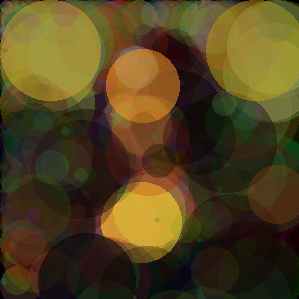

 20%|██        | 10000/50000 [08:05<31:15, 21.32it/s]

127595583


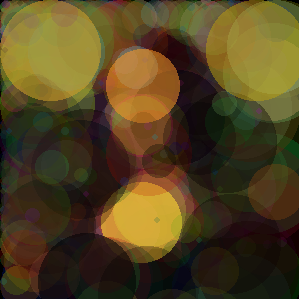

 20%|██        | 10200/50000 [08:15<31:12, 21.26it/s]

127151338


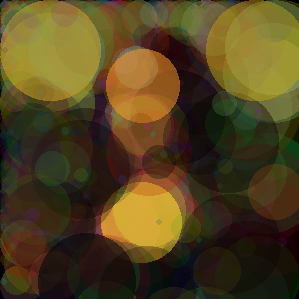

 21%|██        | 10398/50000 [08:24<31:33, 20.91it/s]

126974490


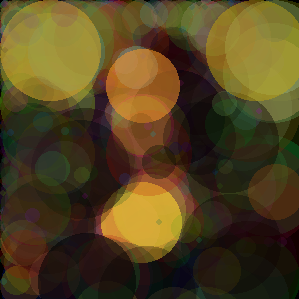

 21%|██        | 10598/50000 [08:34<30:44, 21.36it/s]

126544242


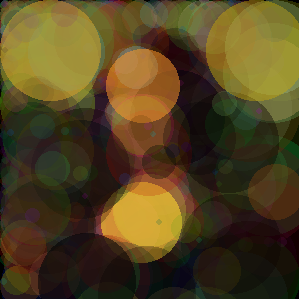

 22%|██▏       | 10799/50000 [08:44<31:37, 20.66it/s]

126132859


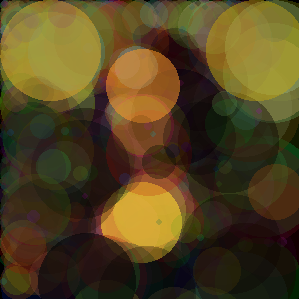

 22%|██▏       | 10999/50000 [08:53<30:41, 21.18it/s]

125159906


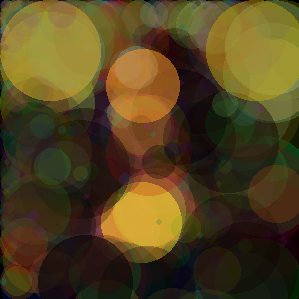

 22%|██▏       | 11200/50000 [09:03<30:36, 21.13it/s]

124613525


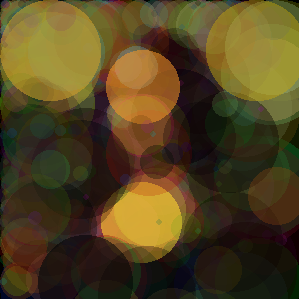

 23%|██▎       | 11398/50000 [09:12<30:45, 20.92it/s]

123971330


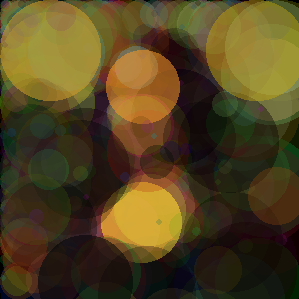

 23%|██▎       | 11598/50000 [09:21<30:09, 21.22it/s]

123631077


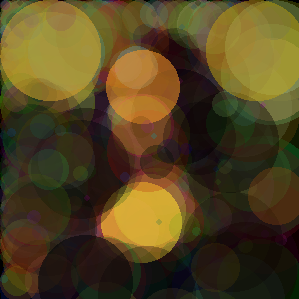

 24%|██▎       | 11799/50000 [09:31<30:13, 21.06it/s]

123400874


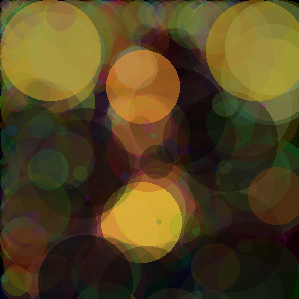

 24%|██▍       | 12000/50000 [09:41<29:48, 21.24it/s]

123125836


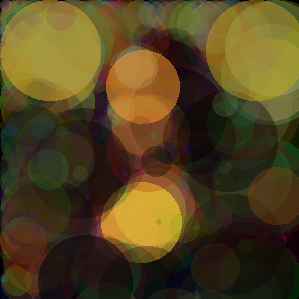

 24%|██▍       | 12198/50000 [09:50<29:35, 21.29it/s]

122583648


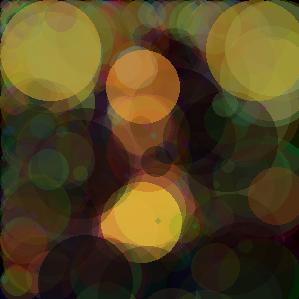

 25%|██▍       | 12398/50000 [10:00<29:53, 20.97it/s]

122410131


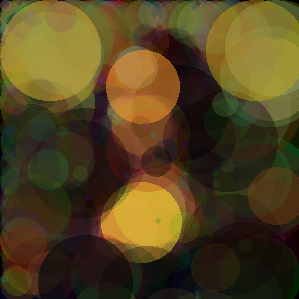

 25%|██▌       | 12599/50000 [10:09<29:19, 21.25it/s]

121858783


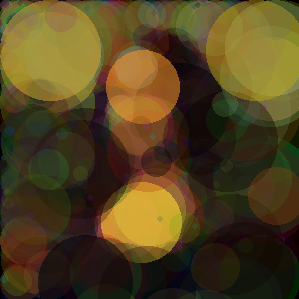

 26%|██▌       | 12800/50000 [10:19<30:10, 20.55it/s]

121772133


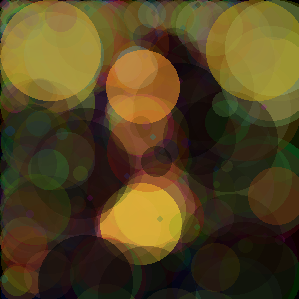

 26%|██▌       | 12998/50000 [10:29<29:47, 20.70it/s]

121371661


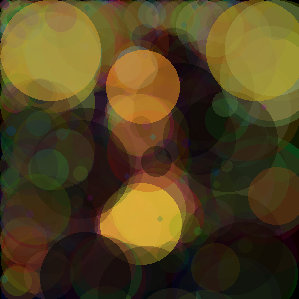

 26%|██▋       | 13198/50000 [10:38<29:48, 20.57it/s]

120937354


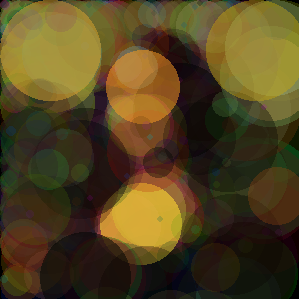

 27%|██▋       | 13398/50000 [10:48<29:09, 20.93it/s]

120544700


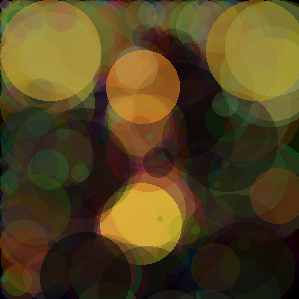

 27%|██▋       | 13598/50000 [10:57<29:07, 20.83it/s]

120410292


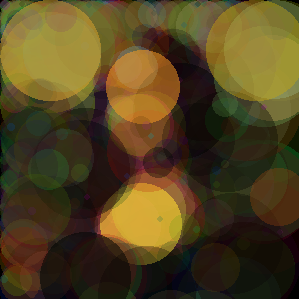

 28%|██▊       | 13799/50000 [11:07<28:28, 21.19it/s]

120265518


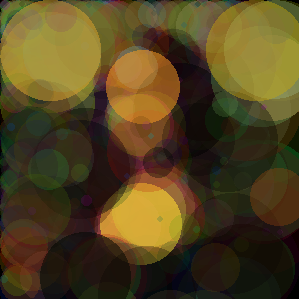

 28%|██▊       | 13998/50000 [11:17<29:21, 20.44it/s]

119992239


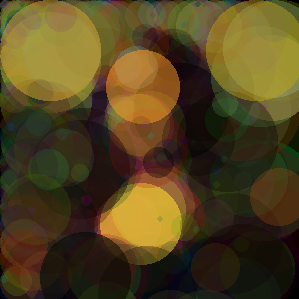

 28%|██▊       | 14199/50000 [11:26<28:50, 20.69it/s]

119521804


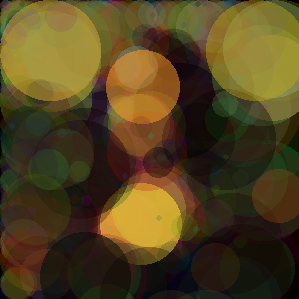

 29%|██▉       | 14398/50000 [11:36<28:03, 21.14it/s]

119224487


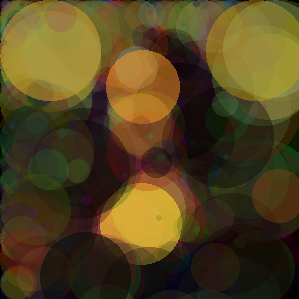

 29%|██▉       | 14599/50000 [11:46<27:46, 21.24it/s]

118841310


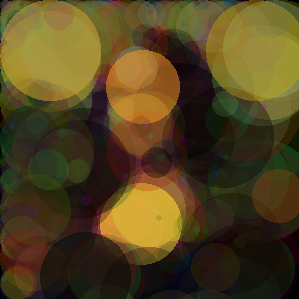

 30%|██▉       | 14800/50000 [11:55<28:00, 20.94it/s]

118654720


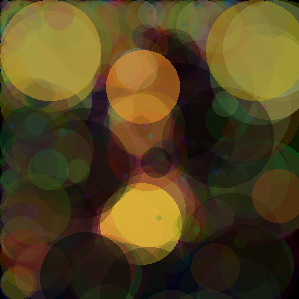

 30%|██▉       | 14998/50000 [12:05<27:08, 21.49it/s]

118361646


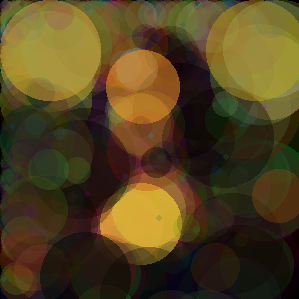

 30%|███       | 15199/50000 [12:14<27:25, 21.15it/s]

117861264


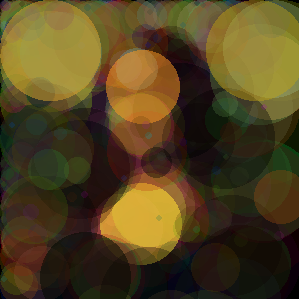

 31%|███       | 15400/50000 [12:24<27:24, 21.04it/s]

117659479


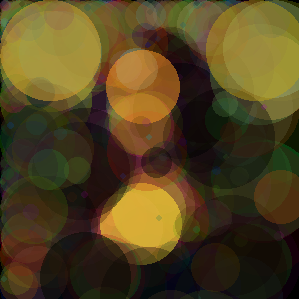

 31%|███       | 15598/50000 [12:33<27:08, 21.13it/s]

117404234


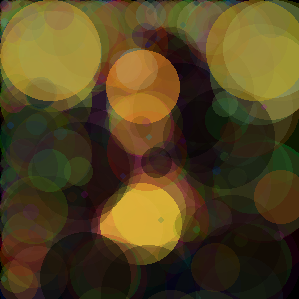

 32%|███▏      | 15799/50000 [12:43<27:16, 20.90it/s]

117195920


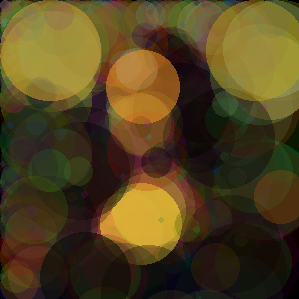

 32%|███▏      | 16000/50000 [12:52<27:00, 20.98it/s]

116808459


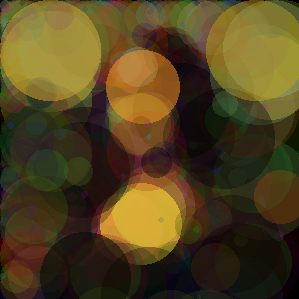

 32%|███▏      | 16198/50000 [13:02<26:32, 21.23it/s]

116605253


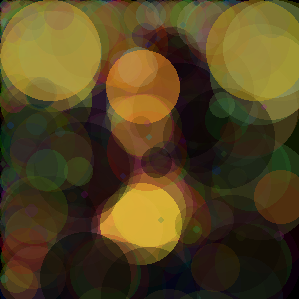

 33%|███▎      | 16399/50000 [13:11<26:35, 21.06it/s]

116382710


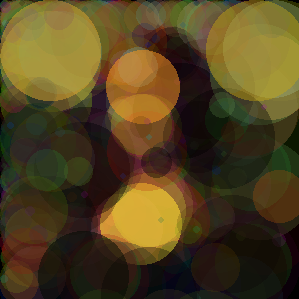

 33%|███▎      | 16600/50000 [13:21<26:48, 20.76it/s]

116301273


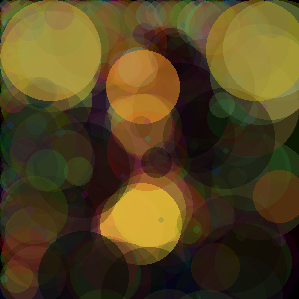

 34%|███▎      | 16798/50000 [13:30<26:09, 21.15it/s]

116223897


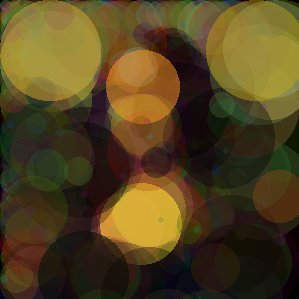

 34%|███▍      | 16999/50000 [13:40<27:15, 20.17it/s]

116121531


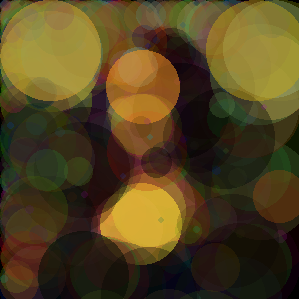

 34%|███▍      | 17199/50000 [13:51<28:24, 19.25it/s]

115698063


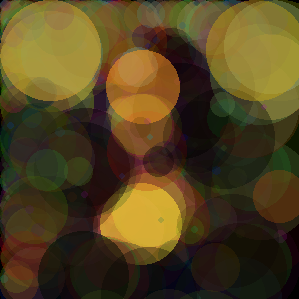

 35%|███▍      | 17398/50000 [14:01<26:22, 20.60it/s]

115493745


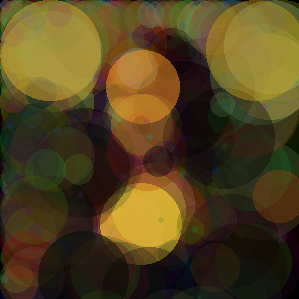

 35%|███▌      | 17598/50000 [14:11<25:38, 21.06it/s]

115376245


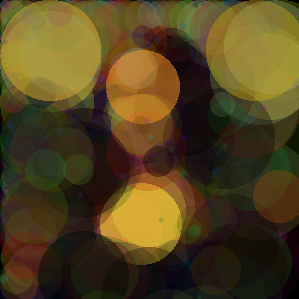

 36%|███▌      | 17799/50000 [14:20<25:52, 20.75it/s]

115124521


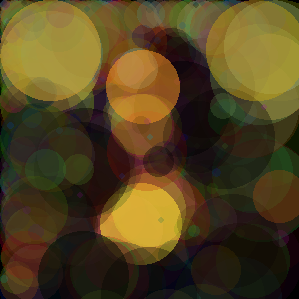

 36%|███▌      | 18000/50000 [14:30<25:01, 21.31it/s]

114817701


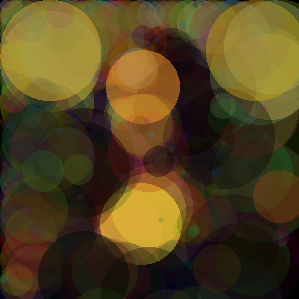

 36%|███▋      | 18198/50000 [14:39<25:01, 21.19it/s]

114423564


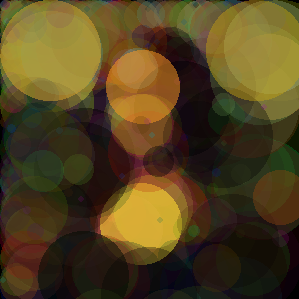

 37%|███▋      | 18399/50000 [14:49<25:23, 20.74it/s]

114133622


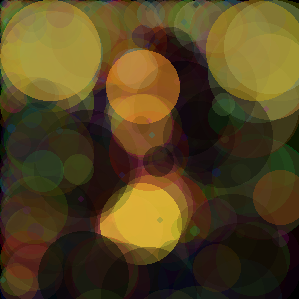

 37%|███▋      | 18600/50000 [14:58<25:04, 20.87it/s]

113968969


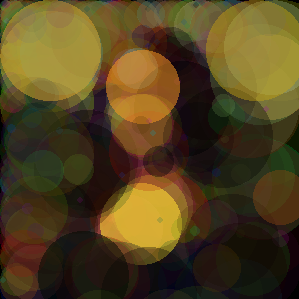

 38%|███▊      | 18798/50000 [15:08<24:45, 21.00it/s]

113915209


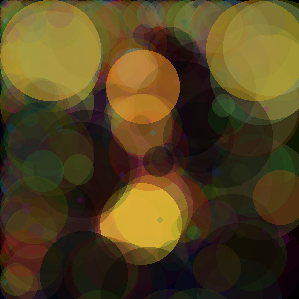

 38%|███▊      | 18998/50000 [15:17<24:09, 21.38it/s]

113526420


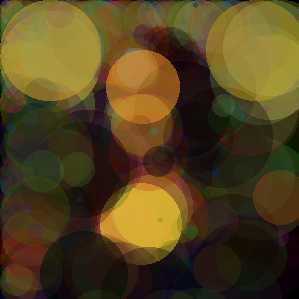

 38%|███▊      | 19199/50000 [15:27<24:08, 21.26it/s]

113336399


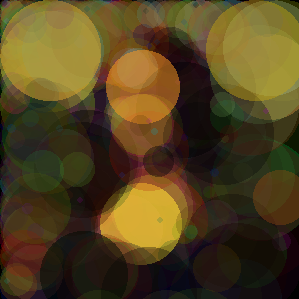

 39%|███▉      | 19400/50000 [15:37<23:56, 21.31it/s]

113295447


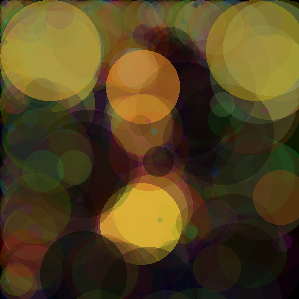

 39%|███▉      | 19598/50000 [15:46<23:35, 21.47it/s]

113234460


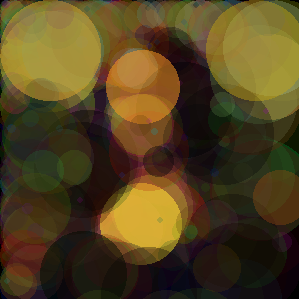

 40%|███▉      | 19799/50000 [15:56<24:19, 20.70it/s]

113114609


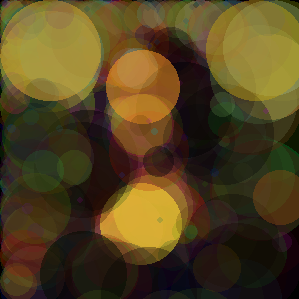

 40%|████      | 20000/50000 [16:05<24:00, 20.83it/s]

112979307


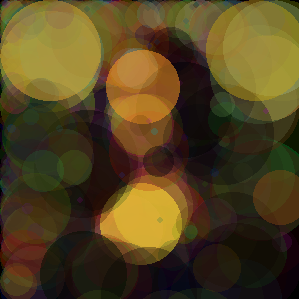

 40%|████      | 20198/50000 [16:15<23:06, 21.49it/s]

112740691


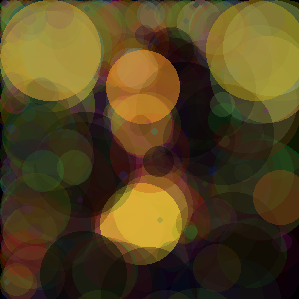

 41%|████      | 20399/50000 [16:24<23:44, 20.78it/s]

112645011


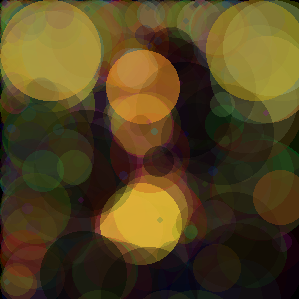

 41%|████      | 20599/50000 [16:34<23:11, 21.12it/s]

112506435


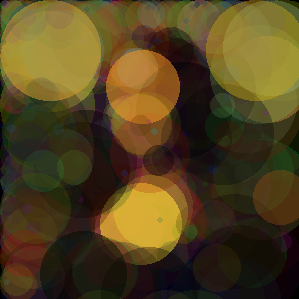

 42%|████▏     | 20800/50000 [16:43<23:23, 20.81it/s]

112355543


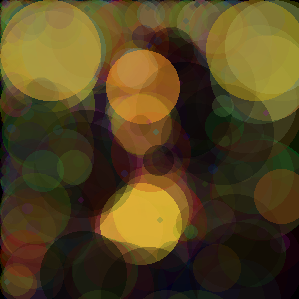

 42%|████▏     | 20998/50000 [16:53<23:12, 20.82it/s]

112295953


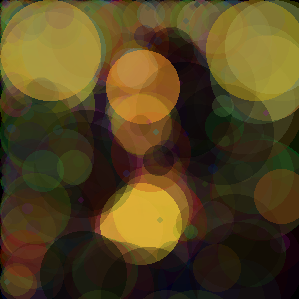

 42%|████▏     | 21200/50000 [17:03<22:48, 21.04it/s]

112150613


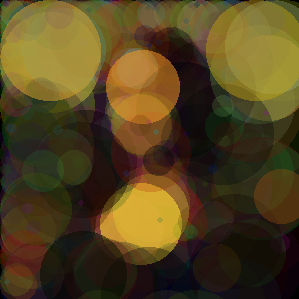

 43%|████▎     | 21398/50000 [17:12<22:38, 21.05it/s]

112099791


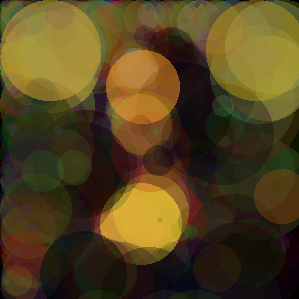

 43%|████▎     | 21599/50000 [17:22<22:10, 21.34it/s]

111910814


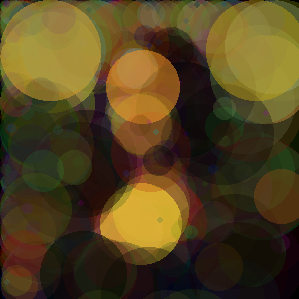

 44%|████▎     | 21800/50000 [17:31<22:27, 20.93it/s]

111757933


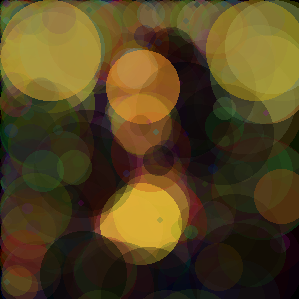

 44%|████▍     | 21998/50000 [17:41<22:13, 21.01it/s]

111602246


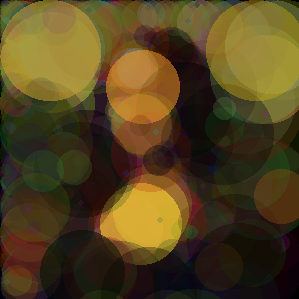

 44%|████▍     | 22199/50000 [17:50<21:50, 21.21it/s]

111416364


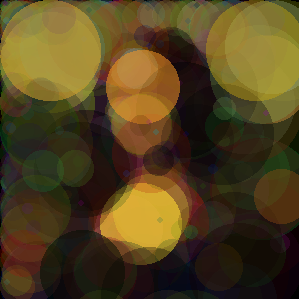

 45%|████▍     | 22400/50000 [18:00<21:57, 20.95it/s]

111196046


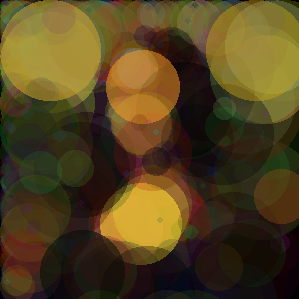

 45%|████▌     | 22598/50000 [18:09<21:42, 21.04it/s]

111095409


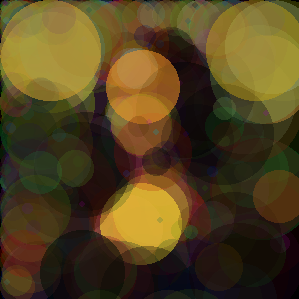

 46%|████▌     | 22799/50000 [18:19<21:38, 20.94it/s]

111048670


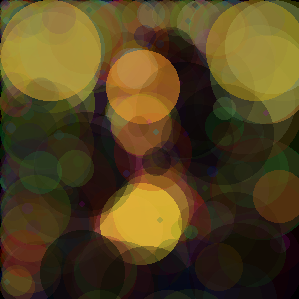

 46%|████▌     | 23000/50000 [18:28<21:18, 21.12it/s]

111022226


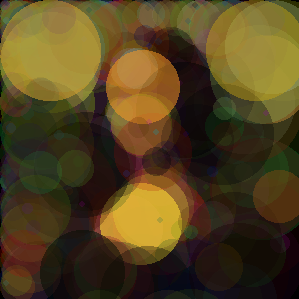

 46%|████▋     | 23198/50000 [18:38<21:03, 21.22it/s]

110822406


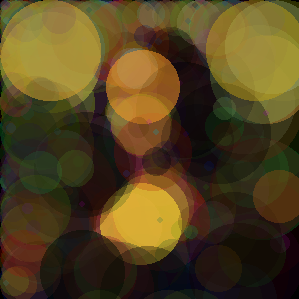

 47%|████▋     | 23399/50000 [18:47<20:50, 21.28it/s]

110628859


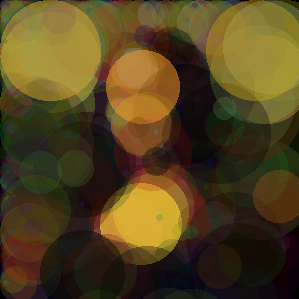

 47%|████▋     | 23600/50000 [18:57<20:34, 21.39it/s]

110558259


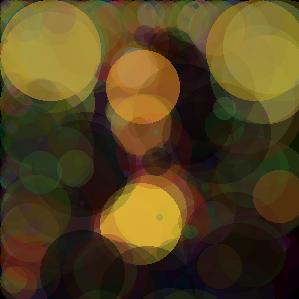

 48%|████▊     | 23798/50000 [19:06<20:41, 21.11it/s]

110550000


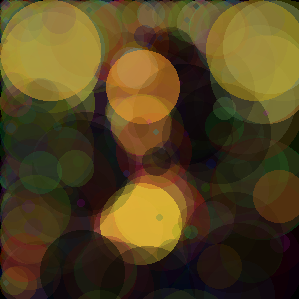

 48%|████▊     | 23999/50000 [19:16<20:11, 21.46it/s]

110161335


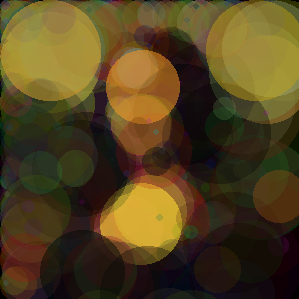

 48%|████▊     | 24200/50000 [19:25<19:50, 21.67it/s]

110077475


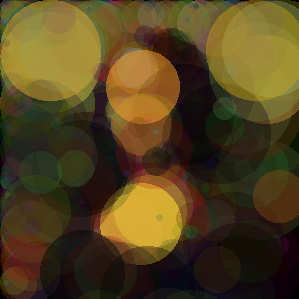

 49%|████▉     | 24398/50000 [19:35<20:24, 20.91it/s]

109934563


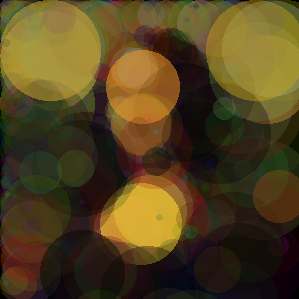

 49%|████▉     | 24598/50000 [19:44<20:07, 21.03it/s]

109827662


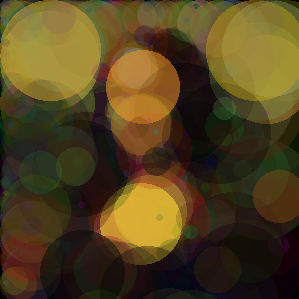

 50%|████▉     | 24799/50000 [19:54<19:44, 21.28it/s]

109748526


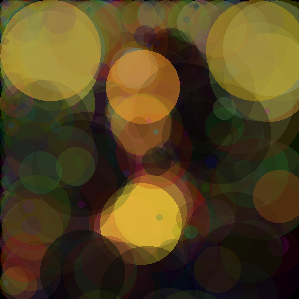

 50%|█████     | 25000/50000 [20:03<20:14, 20.58it/s]

109650642


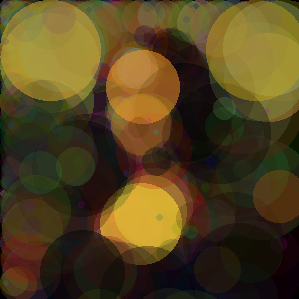

 50%|█████     | 25198/50000 [20:13<19:30, 21.18it/s]

109453343


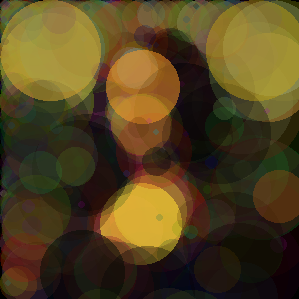

 51%|█████     | 25398/50000 [20:22<20:26, 20.07it/s]

109269752


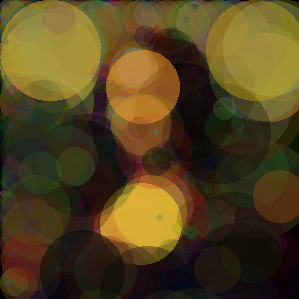

 51%|█████     | 25598/50000 [20:32<19:26, 20.93it/s]

109130299


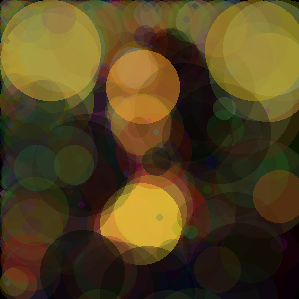

 52%|█████▏    | 25798/50000 [20:41<18:43, 21.54it/s]

109098398


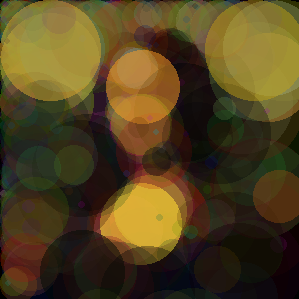

 52%|█████▏    | 25999/50000 [20:51<18:47, 21.28it/s]

108745530


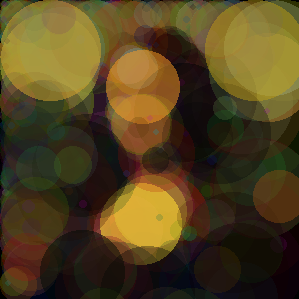

 52%|█████▏    | 26199/50000 [21:00<18:46, 21.13it/s]

108639658


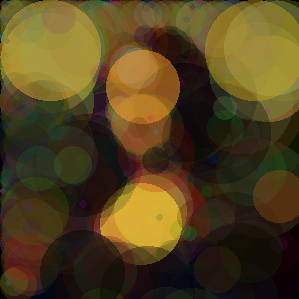

 53%|█████▎    | 26400/50000 [21:10<18:41, 21.05it/s]

108233394


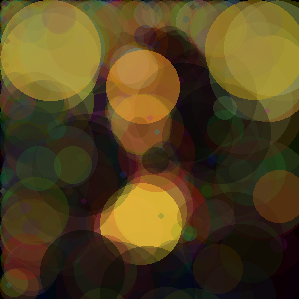

 53%|█████▎    | 26598/50000 [21:19<18:24, 21.18it/s]

107794865


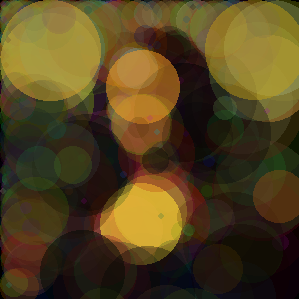

 54%|█████▎    | 26799/50000 [21:29<18:31, 20.87it/s]

107714204


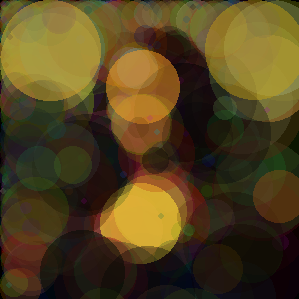

 54%|█████▍    | 27000/50000 [21:38<17:55, 21.38it/s]

107600469


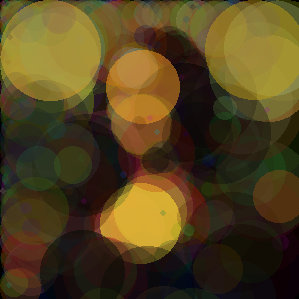

 54%|█████▍    | 27198/50000 [21:48<18:04, 21.03it/s]

107537408


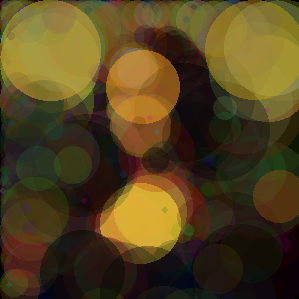

 55%|█████▍    | 27399/50000 [21:57<17:47, 21.17it/s]

107327511


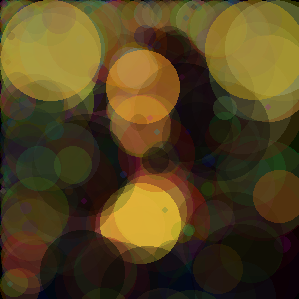

 55%|█████▌    | 27599/50000 [22:07<18:06, 20.62it/s]

107226239


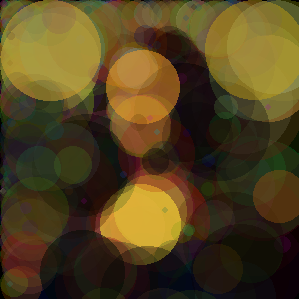

 56%|█████▌    | 27799/50000 [22:17<17:41, 20.91it/s]

107070451


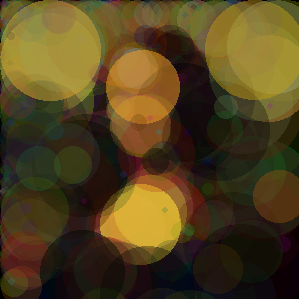

 56%|█████▌    | 27999/50000 [22:26<17:02, 21.52it/s]

107013984


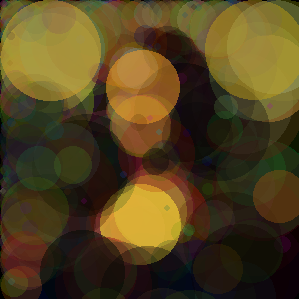

 56%|█████▋    | 28200/50000 [22:36<16:43, 21.73it/s]

106834352


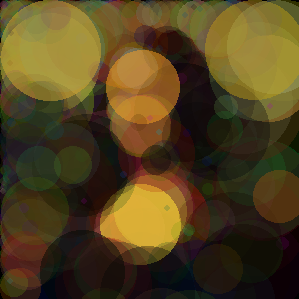

 57%|█████▋    | 28398/50000 [22:45<17:33, 20.50it/s]

106736237


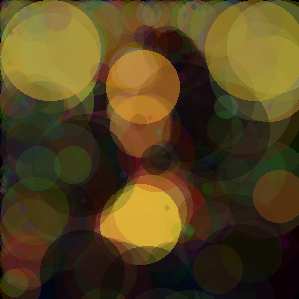

 57%|█████▋    | 28598/50000 [22:54<16:45, 21.28it/s]

106630144


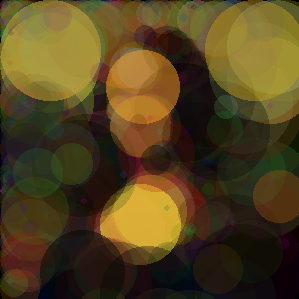

 58%|█████▊    | 28799/50000 [23:04<16:34, 21.32it/s]

106627309


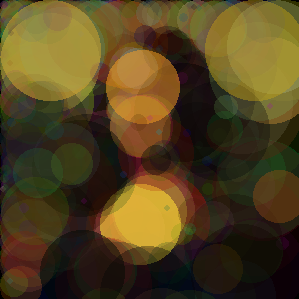

 58%|█████▊    | 29000/50000 [23:14<17:00, 20.57it/s]

106476227


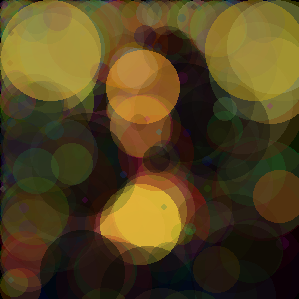

 58%|█████▊    | 29198/50000 [23:23<16:16, 21.31it/s]

106474952


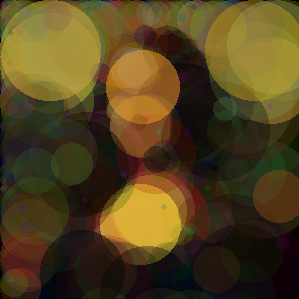

 59%|█████▉    | 29399/50000 [23:32<16:09, 21.24it/s]

106281359


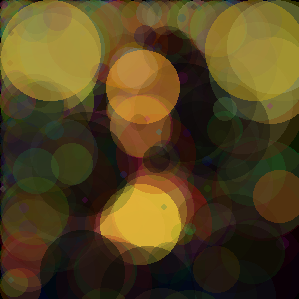

 59%|█████▉    | 29600/50000 [23:42<15:50, 21.46it/s]

106238597


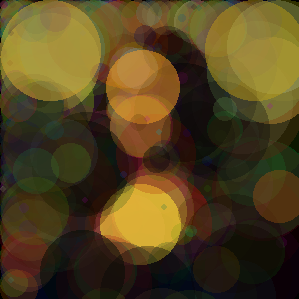

 60%|█████▉    | 29800/50000 [23:51<15:59, 21.05it/s]

106147140


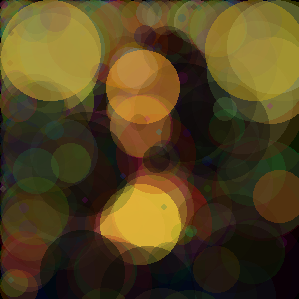

 60%|██████    | 30000/50000 [24:01<15:34, 21.40it/s]

106080831


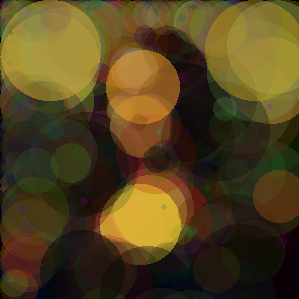

 60%|██████    | 30198/50000 [24:10<15:26, 21.37it/s]

106011564


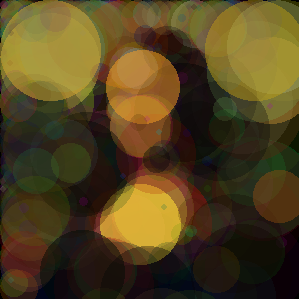

 61%|██████    | 30399/50000 [24:20<15:24, 21.21it/s]

105920726


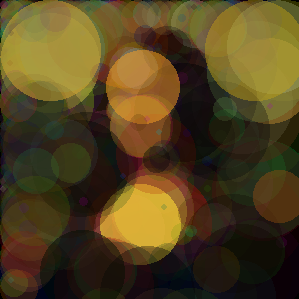

 61%|██████    | 30600/50000 [24:29<15:29, 20.86it/s]

105920726


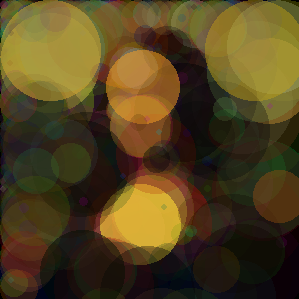

 62%|██████▏   | 30798/50000 [24:38<15:01, 21.29it/s]

105804140


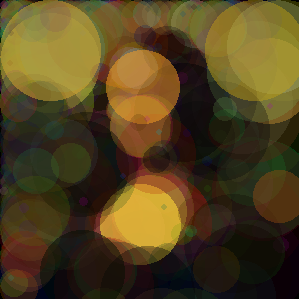

 62%|██████▏   | 30999/50000 [24:48<14:56, 21.19it/s]

105804140


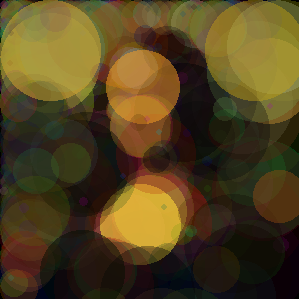

 62%|██████▏   | 31200/50000 [24:57<14:40, 21.36it/s]

105737775


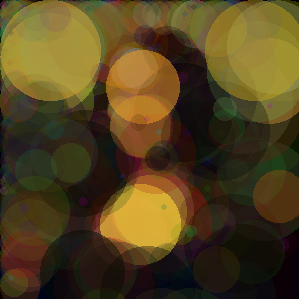

 63%|██████▎   | 31398/50000 [25:07<14:19, 21.65it/s]

105737775


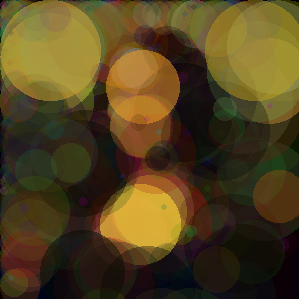

 63%|██████▎   | 31599/50000 [25:16<14:24, 21.28it/s]

105493987


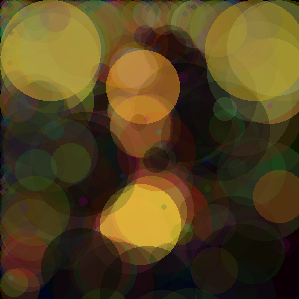

 64%|██████▎   | 31800/50000 [25:26<14:14, 21.30it/s]

105289241


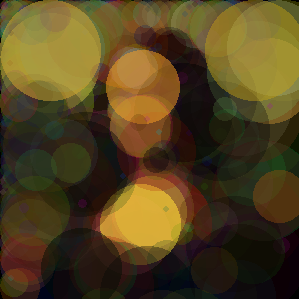

 64%|██████▍   | 32000/50000 [25:35<13:54, 21.56it/s]

105275830


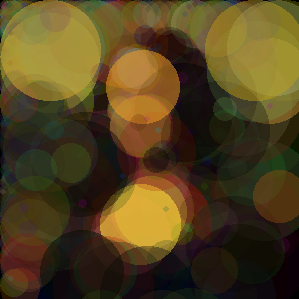

 64%|██████▍   | 32198/50000 [25:44<13:53, 21.36it/s]

105113014


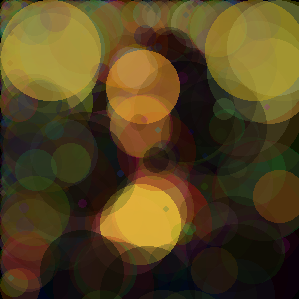

 65%|██████▍   | 32399/50000 [25:54<13:45, 21.31it/s]

105029521


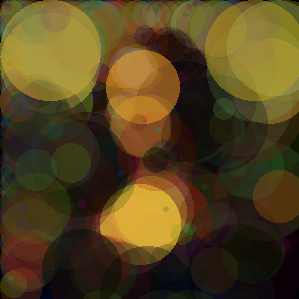

 65%|██████▌   | 32600/50000 [26:03<13:29, 21.50it/s]

104959996


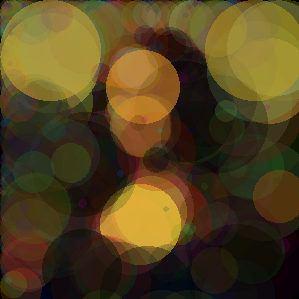

 66%|██████▌   | 32798/50000 [26:13<13:19, 21.52it/s]

104915845


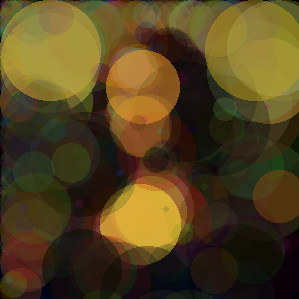

 66%|██████▌   | 32999/50000 [26:22<13:38, 20.77it/s]

104820500


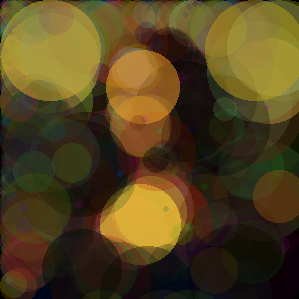

 66%|██████▋   | 33200/50000 [26:32<12:58, 21.58it/s]

104820163


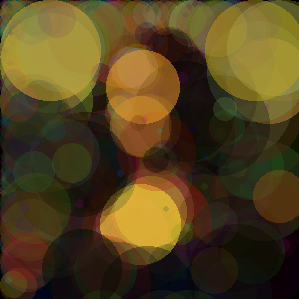

 67%|██████▋   | 33398/50000 [26:41<13:00, 21.27it/s]

104681054


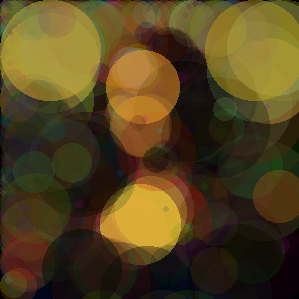

 67%|██████▋   | 33599/50000 [26:51<12:58, 21.05it/s]

104613723


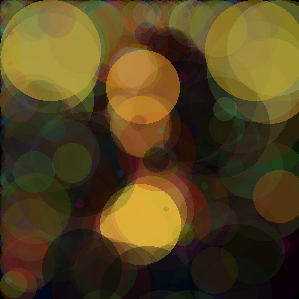

 68%|██████▊   | 33800/50000 [27:00<12:41, 21.29it/s]

104561521


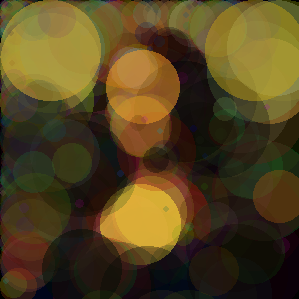

 68%|██████▊   | 33998/50000 [27:09<12:29, 21.34it/s]

104527227


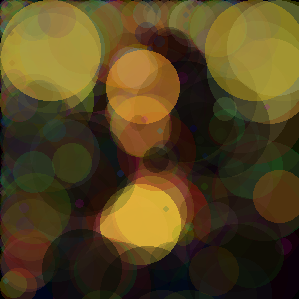

 68%|██████▊   | 34199/50000 [27:19<12:12, 21.56it/s]

104527227


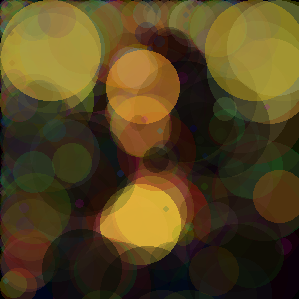

 69%|██████▉   | 34400/50000 [27:29<12:32, 20.72it/s]

104331273


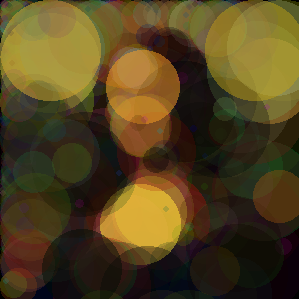

 69%|██████▉   | 34599/50000 [27:38<11:54, 21.55it/s]

104303165


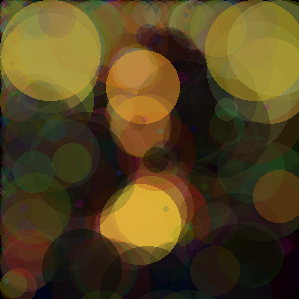

 70%|██████▉   | 34800/50000 [27:47<11:37, 21.78it/s]

104237012


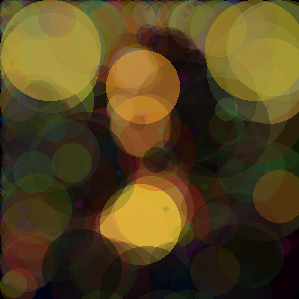

 70%|██████▉   | 34998/50000 [27:57<11:55, 20.98it/s]

104234709


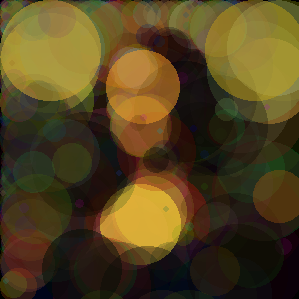

 70%|███████   | 35198/50000 [28:06<11:29, 21.47it/s]

104221096


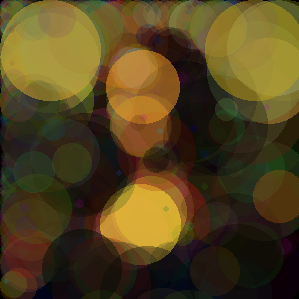

 71%|███████   | 35399/50000 [28:16<11:18, 21.52it/s]

104097437


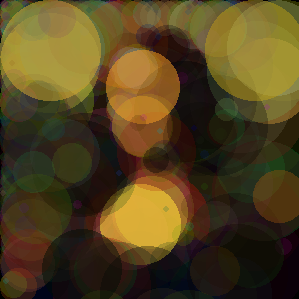

 71%|███████   | 35600/50000 [28:25<11:20, 21.15it/s]

103948788


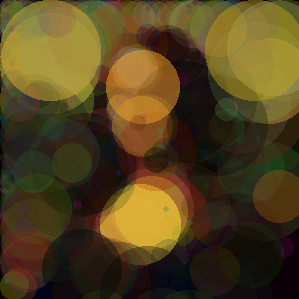

 72%|███████▏  | 35798/50000 [28:35<11:20, 20.88it/s]

103888247


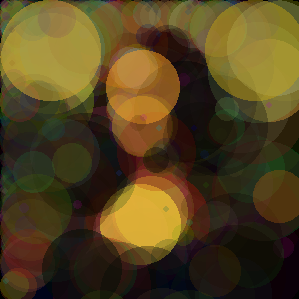

 72%|███████▏  | 35998/50000 [28:44<11:02, 21.15it/s]

103861644


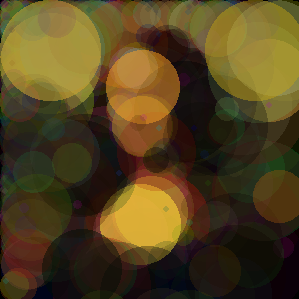

 72%|███████▏  | 36199/50000 [28:54<10:46, 21.34it/s]

103669843


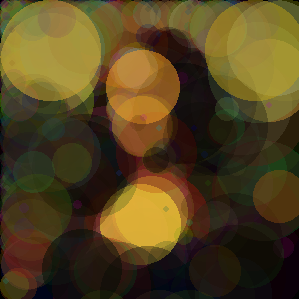

 73%|███████▎  | 36400/50000 [29:03<10:55, 20.75it/s]

103322169


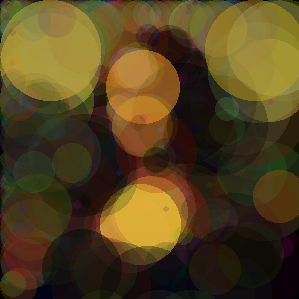

 73%|███████▎  | 36598/50000 [29:13<10:22, 21.54it/s]

103293454


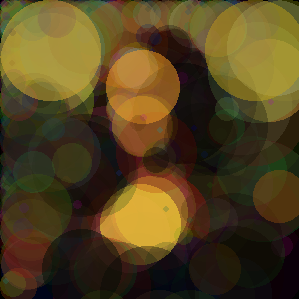

 74%|███████▎  | 36799/50000 [29:22<10:26, 21.07it/s]

103155962


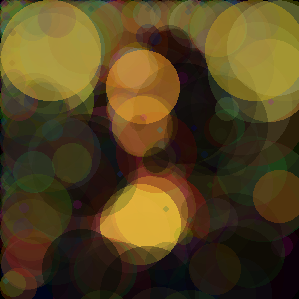

 74%|███████▍  | 37000/50000 [29:31<10:02, 21.56it/s]

103097449


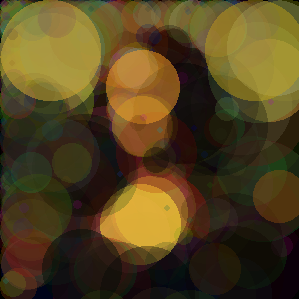

 74%|███████▍  | 37198/50000 [29:41<09:53, 21.55it/s]

103097449


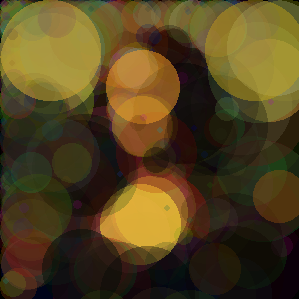

 75%|███████▍  | 37399/50000 [29:50<09:57, 21.08it/s]

103097449


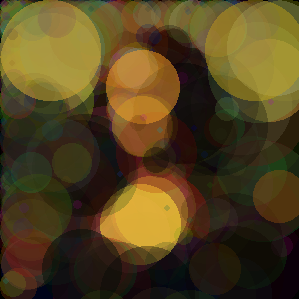

 75%|███████▌  | 37600/50000 [30:00<09:45, 21.17it/s]

103037295


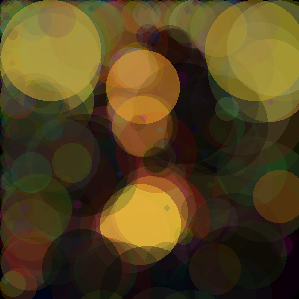

 76%|███████▌  | 37798/50000 [30:09<09:32, 21.31it/s]

103037295


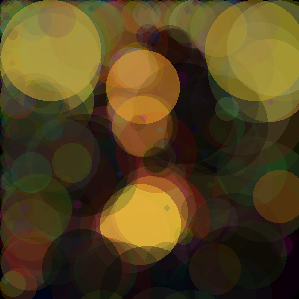

 76%|███████▌  | 37999/50000 [30:18<09:18, 21.49it/s]

103021705


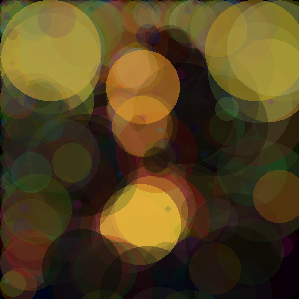

 76%|███████▋  | 38200/50000 [30:28<09:14, 21.27it/s]

102996221


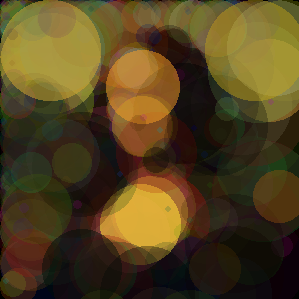

 77%|███████▋  | 38398/50000 [30:38<09:23, 20.57it/s]

102971391


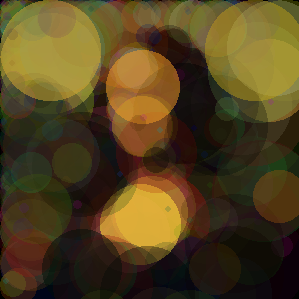

 77%|███████▋  | 38599/50000 [30:47<08:51, 21.46it/s]

102971391


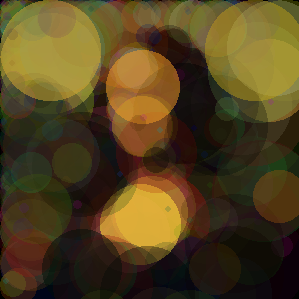

 78%|███████▊  | 38800/50000 [30:57<08:58, 20.80it/s]

102971391


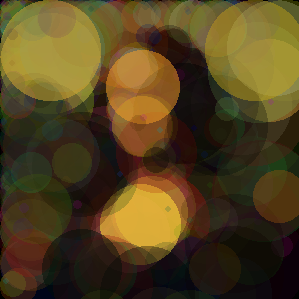

 78%|███████▊  | 38998/50000 [31:06<08:37, 21.26it/s]

102854095


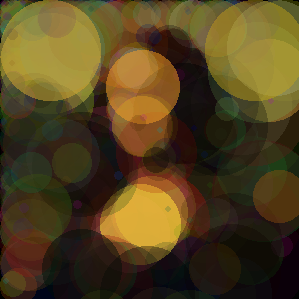

 78%|███████▊  | 39199/50000 [31:15<08:29, 21.18it/s]

102810288


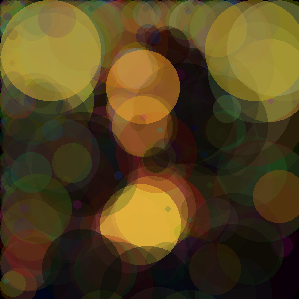

 79%|███████▉  | 39400/50000 [31:25<08:10, 21.59it/s]

102778703


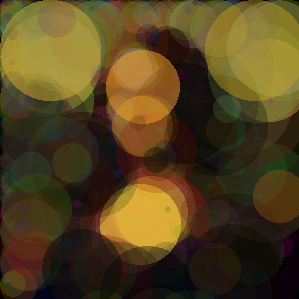

 79%|███████▉  | 39598/50000 [31:34<08:12, 21.11it/s]

102778703


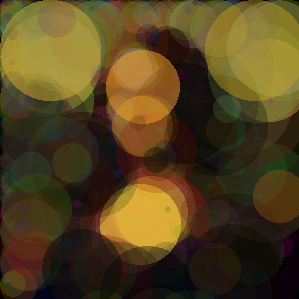

 80%|███████▉  | 39799/50000 [31:43<07:52, 21.61it/s]

102677805


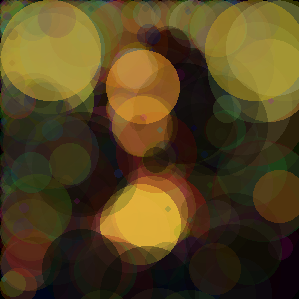

 80%|████████  | 40000/50000 [31:53<07:44, 21.52it/s]

102677805


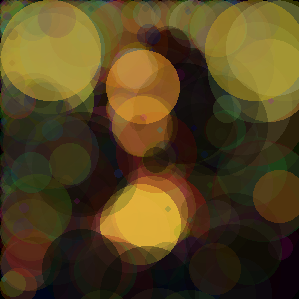

 80%|████████  | 40198/50000 [32:02<07:39, 21.33it/s]

102581451


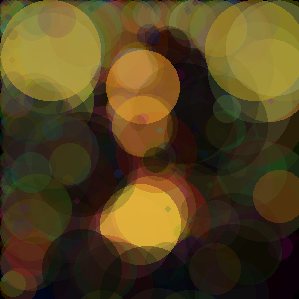

 81%|████████  | 40399/50000 [32:12<07:41, 20.78it/s]

102556260


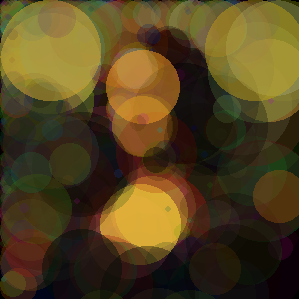

 81%|████████  | 40600/50000 [32:21<07:21, 21.30it/s]

102422038


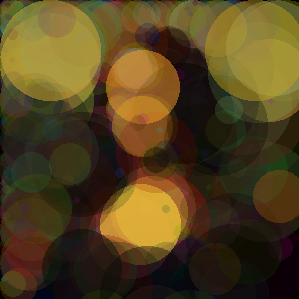

 82%|████████▏ | 40798/50000 [32:30<07:11, 21.30it/s]

102375433


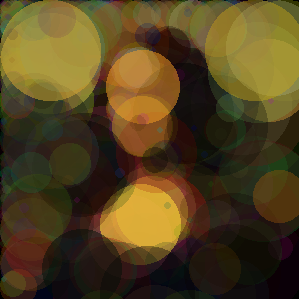

 82%|████████▏ | 40999/50000 [32:40<07:25, 20.22it/s]

102375433


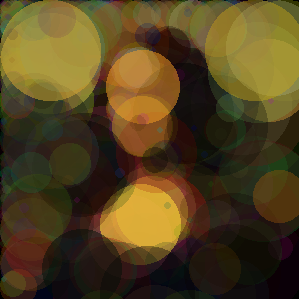

 82%|████████▏ | 41200/50000 [32:50<07:14, 20.26it/s]

102312875


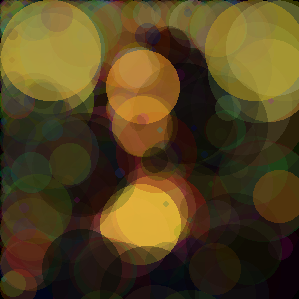

 83%|████████▎ | 41399/50000 [33:00<06:51, 20.91it/s]

102280603


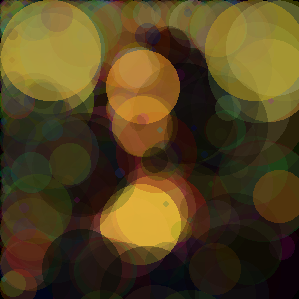

 83%|████████▎ | 41600/50000 [33:09<06:32, 21.40it/s]

102280603


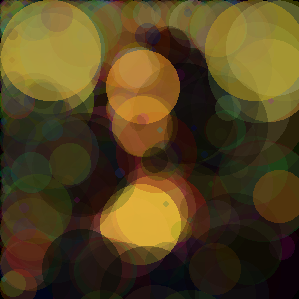

 84%|████████▎ | 41798/50000 [33:19<06:26, 21.21it/s]

102264827


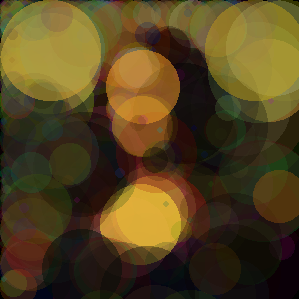

 84%|████████▍ | 41999/50000 [33:28<06:20, 21.01it/s]

102219681


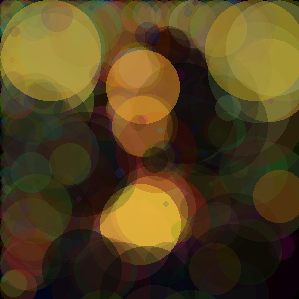

 84%|████████▍ | 42200/50000 [33:38<06:03, 21.44it/s]

102133609


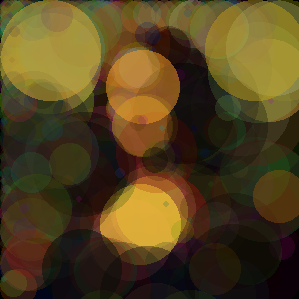

 85%|████████▍ | 42398/50000 [33:47<05:56, 21.33it/s]

102107823


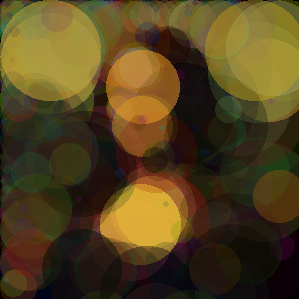

 85%|████████▌ | 42599/50000 [33:57<05:54, 20.86it/s]

102076491


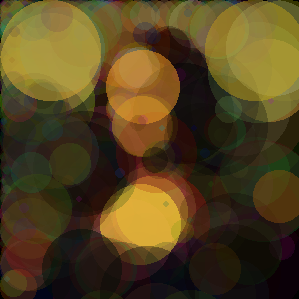

 86%|████████▌ | 42800/50000 [34:06<05:38, 21.26it/s]

102044216


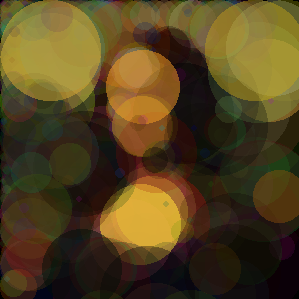

 86%|████████▌ | 42998/50000 [34:16<05:29, 21.25it/s]

101902074


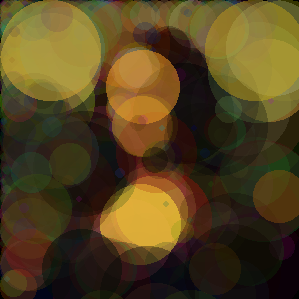

 86%|████████▋ | 43199/50000 [34:25<05:25, 20.88it/s]

101902074


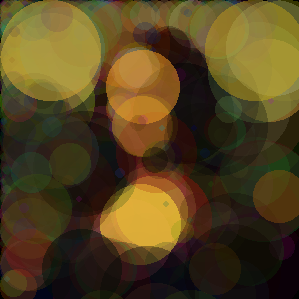

 87%|████████▋ | 43400/50000 [34:35<05:13, 21.03it/s]

101902074


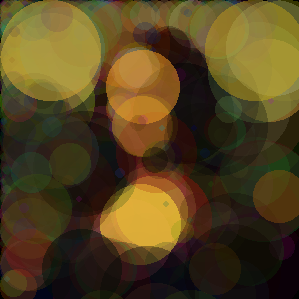

 87%|████████▋ | 43598/50000 [34:44<05:00, 21.27it/s]

101853154


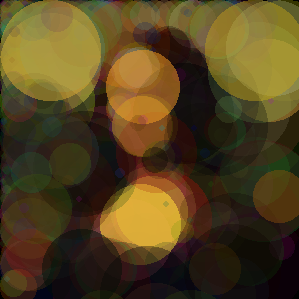

 88%|████████▊ | 43799/50000 [34:54<04:46, 21.61it/s]

101812916


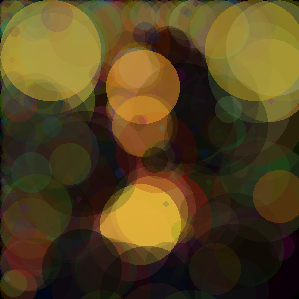

 88%|████████▊ | 44000/50000 [35:03<04:46, 20.94it/s]

101812916


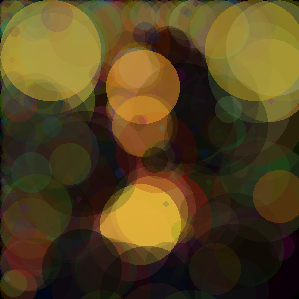

 88%|████████▊ | 44198/50000 [35:12<04:29, 21.55it/s]

101756534


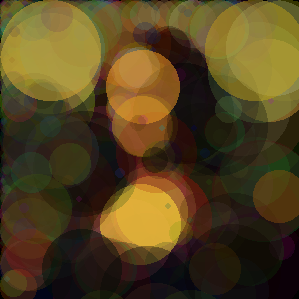

 89%|████████▉ | 44399/50000 [35:22<04:20, 21.51it/s]

101697112


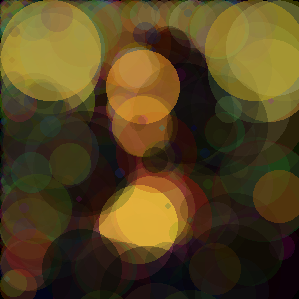

 89%|████████▉ | 44600/50000 [35:31<04:09, 21.63it/s]

101603116


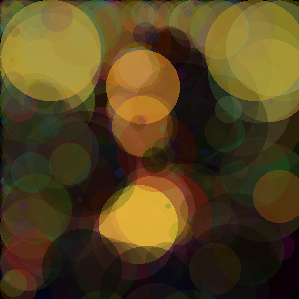

 90%|████████▉ | 44798/50000 [35:41<04:05, 21.15it/s]

101603116


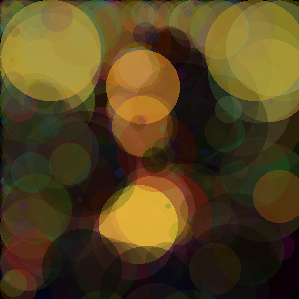

 90%|████████▉ | 44999/50000 [35:50<03:54, 21.32it/s]

101603116


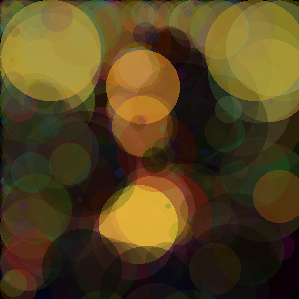

 90%|█████████ | 45200/50000 [36:00<03:46, 21.23it/s]

101581340


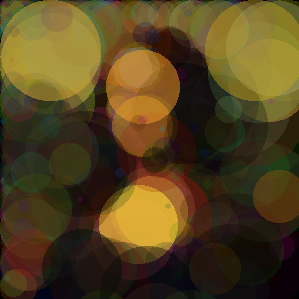

 91%|█████████ | 45398/50000 [36:09<03:41, 20.77it/s]

101457154


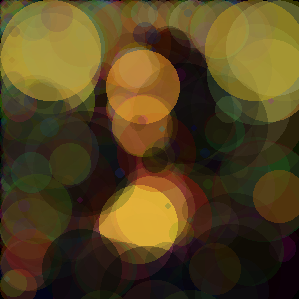

 91%|█████████ | 45598/50000 [36:19<03:25, 21.42it/s]

101376380


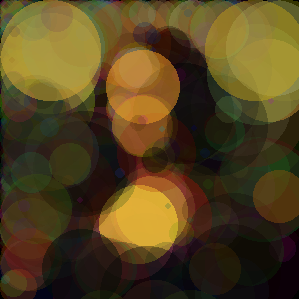

 92%|█████████▏| 45799/50000 [36:28<03:13, 21.71it/s]

101369893


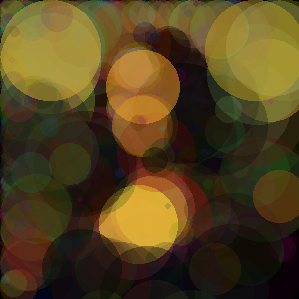

 92%|█████████▏| 46000/50000 [36:38<03:05, 21.59it/s]

101309801


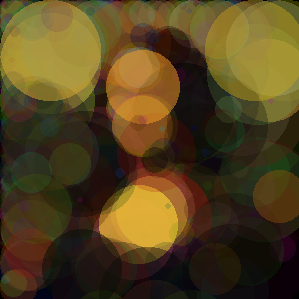

 92%|█████████▏| 46198/50000 [36:47<03:00, 21.05it/s]

101156003


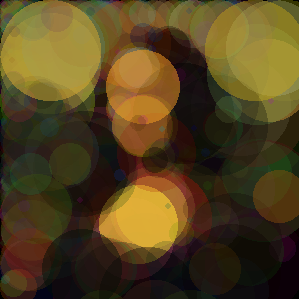

 93%|█████████▎| 46399/50000 [36:56<02:49, 21.29it/s]

101133132


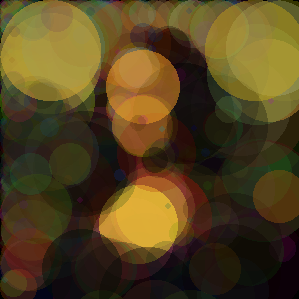

 93%|█████████▎| 46600/50000 [37:06<02:42, 20.97it/s]

100931238


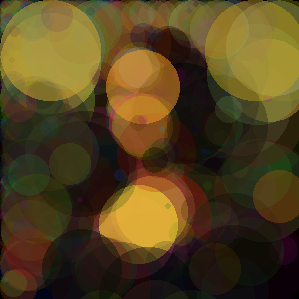

 94%|█████████▎| 46800/50000 [37:16<02:31, 21.10it/s]

100851914


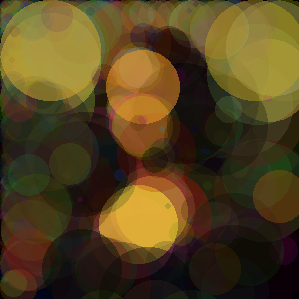

 94%|█████████▍| 46998/50000 [37:25<02:22, 21.07it/s]

100774248


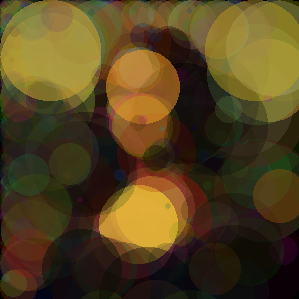

 94%|█████████▍| 47199/50000 [37:34<02:10, 21.52it/s]

100774248


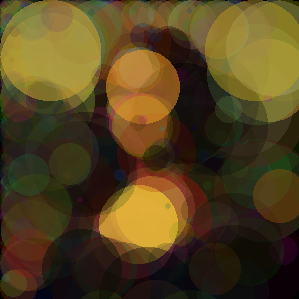

 95%|█████████▍| 47400/50000 [37:44<02:01, 21.43it/s]

100774248


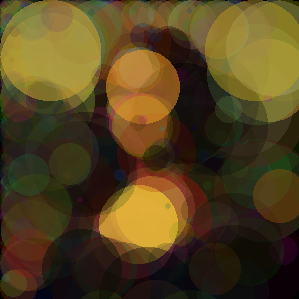

 95%|█████████▌| 47598/50000 [37:53<01:52, 21.27it/s]

100718875


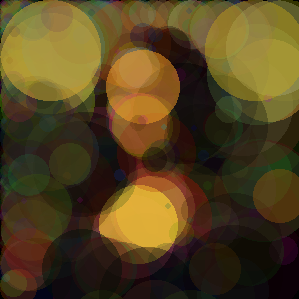

 96%|█████████▌| 47800/50000 [38:03<01:45, 20.83it/s]

100566537


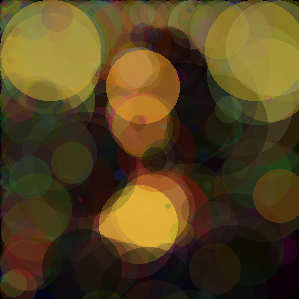

 96%|█████████▌| 47998/50000 [38:13<01:41, 19.70it/s]

100537932


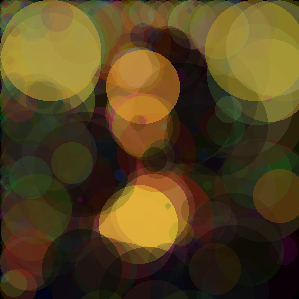

 96%|█████████▋| 48198/50000 [38:22<01:23, 21.64it/s]

100519764


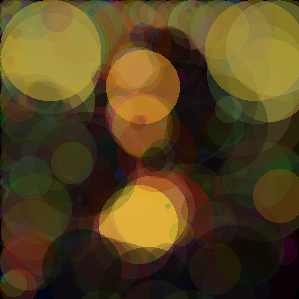

 97%|█████████▋| 48399/50000 [38:32<01:14, 21.37it/s]

100478159


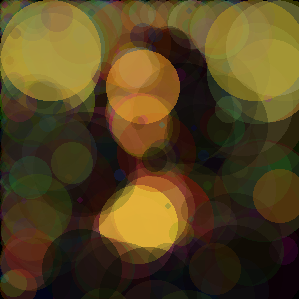

 97%|█████████▋| 48600/50000 [38:41<01:06, 21.04it/s]

100448802


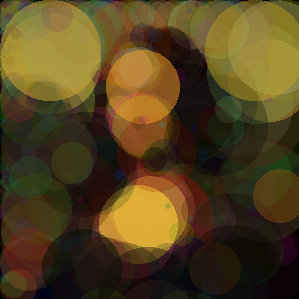

 98%|█████████▊| 48798/50000 [38:51<00:57, 21.04it/s]

100429332


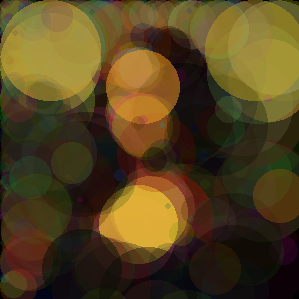

 98%|█████████▊| 48998/50000 [39:00<00:47, 21.18it/s]

100429332


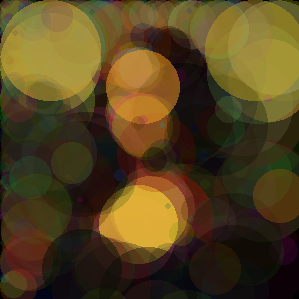

 98%|█████████▊| 49198/50000 [39:10<00:38, 20.91it/s]

100429332


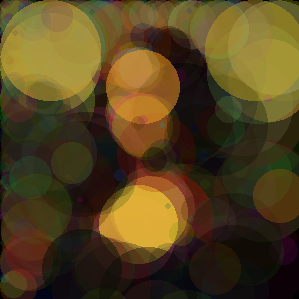

 99%|█████████▉| 49399/50000 [39:19<00:28, 21.35it/s]

100352192


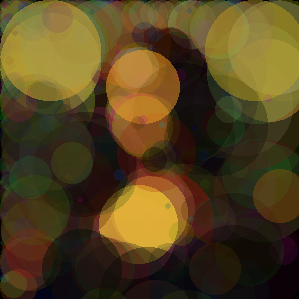

 99%|█████████▉| 49600/50000 [39:29<00:18, 21.58it/s]

100300261


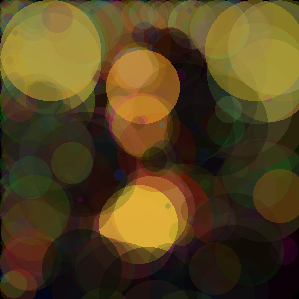

100%|█████████▉| 49798/50000 [39:38<00:09, 21.78it/s]

100300261


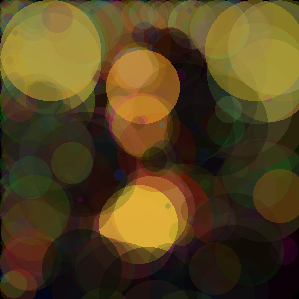

100%|██████████| 50000/50000 [39:47<00:00, 20.94it/s]


In [ ]:
random.seed(0)
np.random.seed(0)

best, c = main_loop(50000, 5, 450, 0.05, 3)

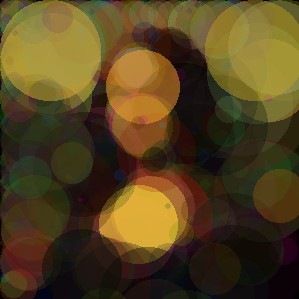

In [ ]:
IPython.display.display(shapes_to_image(best.astype('int')))

In [ ]:
c[-1]

100236710.0

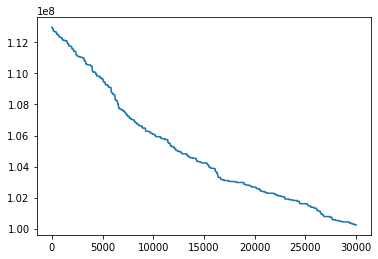

In [ ]:
plt.plot(c[20000:])